In [ ]:
! pip install kaggle --q
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [2]:
! kaggle datasets download -d masoudnickparvar/brain-tumor-mri-dataset

100% 148M/149M [00:00<00:00, 196MB/s]
100% 149M/149M [00:00<00:00, 184MB/s]


In [3]:
!unzip /content/brain-tumor-mri-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Training/glioma/Tr-gl_0712.jpg  
  inflating: Training/glioma/Tr-gl_0713.jpg  
  inflating: Training/glioma/Tr-gl_0714.jpg  
  inflating: Training/glioma/Tr-gl_0715.jpg  
  inflating: Training/glioma/Tr-gl_0716.jpg  
  inflating: Training/glioma/Tr-gl_0717.jpg  
  inflating: Training/glioma/Tr-gl_0718.jpg  
  inflating: Training/glioma/Tr-gl_0719.jpg  
  inflating: Training/glioma/Tr-gl_0720.jpg  
  inflating: Training/glioma/Tr-gl_0721.jpg  
  inflating: Training/glioma/Tr-gl_0722.jpg  
  inflating: Training/glioma/Tr-gl_0723.jpg  
  inflating: Training/glioma/Tr-gl_0724.jpg  
  inflating: Training/glioma/Tr-gl_0725.jpg  
  inflating: Training/glioma/Tr-gl_0726.jpg  
  inflating: Training/glioma/Tr-gl_0727.jpg  
  inflating: Training/glioma/Tr-gl_0728.jpg  
  inflating: Training/glioma/Tr-gl_0729.jpg  
  inflating: Training/glioma/Tr-gl_0730.jpg  
  inflating: Training/glioma/Tr-gl_0731.jpg  
  inflating: Training/glioma/

In [4]:
import os
import shutil

# Define the source folder
source_folder = "/content/Training/meningioma"

# Define the destination folder where you want to save the images
destination_folder = "/content/Images/Meningioma"

# Ensure the destination folder exists
if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

# List files in the source folder
files = os.listdir(source_folder)

# Counter for the number of images copied
num_images_copied = 0

# Iterate through files in the source folder
for file_name in files:
    # Check if the file is an image
    if file_name.endswith(".jpg") or file_name.endswith(".png") or file_name.endswith(".jpeg"):
        # Copy the file to the destination folder
        shutil.copy(os.path.join(source_folder, file_name), destination_folder)
        num_images_copied += 1
        print(f"Copied {file_name} to {destination_folder}")

        # Break the loop if 15 images have been copied
        if num_images_copied >= 15:
            break

print("Task completed. 15 images copied.")


Copied Tr-me_1057.jpg to /content/Images/Meningioma
Copied Tr-me_0712.jpg to /content/Images/Meningioma
Copied Tr-me_0413.jpg to /content/Images/Meningioma
Copied Tr-me_0480.jpg to /content/Images/Meningioma
Copied Tr-me_1316.jpg to /content/Images/Meningioma
Copied Tr-me_1240.jpg to /content/Images/Meningioma
Copied Tr-me_1136.jpg to /content/Images/Meningioma
Copied Tr-me_0070.jpg to /content/Images/Meningioma
Copied Tr-me_0616.jpg to /content/Images/Meningioma
Copied Tr-me_0938.jpg to /content/Images/Meningioma
Copied Tr-me_0244.jpg to /content/Images/Meningioma
Copied Tr-me_1203.jpg to /content/Images/Meningioma
Copied Tr-me_0763.jpg to /content/Images/Meningioma
Copied Tr-me_1059.jpg to /content/Images/Meningioma
Copied Tr-me_0211.jpg to /content/Images/Meningioma
Task completed. 15 images copied.


In [5]:
import shutil

# Path to the folder you want to zip
folder_path = '/content/Images'

# Name of the zipped file
zip_file_name = 'Images.zip'

# Zip the folder
shutil.make_archive('/content/' + zip_file_name.split('.')[0], 'zip', folder_path)

# Provide download link
print("Download your zipped folder:")
print(f"/content/{zip_file_name}")


Download your zipped folder:
/content/Images.zip


In [6]:
! pip install torchinfo scikit-plot --q

In [7]:
import random
import os
import glob
import time
import warnings

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torchvision
import torch.optim.lr_scheduler as lr_scheduler

from torch import nn
from torch.utils.data import (Dataset, DataLoader)

from torchvision import transforms
from torchinfo import summary

from PIL import Image
from tqdm.notebook import tqdm
from typing import Dict, List, Tuple
from scikitplot.metrics import plot_roc

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, precision_recall_fscore_support,
    accuracy_score, top_k_accuracy_score, f1_score,
    matthews_corrcoef, confusion_matrix, ConfusionMatrixDisplay
)

In [8]:
class CFG:
    DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
    NUM_DEVICES = torch.cuda.device_count()
    NUM_WORKERS = os.cpu_count()
    NUM_CLASSES = 4
    EPOCHS = 30
    BATCH_SIZE = (
        32 if torch.cuda.device_count() < 2
        else (32 * torch.cuda.device_count())
    )
    LR = 0.001
    APPLY_SHUFFLE = True
    SEED = 768
    HEIGHT = 224
    WIDTH = 224
    CHANNELS = 3
    IMAGE_SIZE = (224, 224, 3)

    # Define paths
    DATASET_PATH = "brain-tumor-mri-dataset/"
    TRAIN_PATH = 'Training/'
    TEST_PATH = 'Testing/'

# Mute warnings
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")

# 1 | Data Exploration
<a id='1.1'></a>
### Get image paths with glob

In [9]:
%%time
train_images = glob.glob(f"{CFG.TRAIN_PATH}**/*.jpg")
test_images = glob.glob(f"{CFG.TEST_PATH}**/*.jpg")

CPU times: user 22.6 ms, sys: 3.09 ms, total: 25.7 ms
Wall time: 50.5 ms


<a id='1.2'></a>
### Create Pandas DataFrames for paths and labels

In [10]:
def generate_labels(image_paths):
    return [(_.split('/')[-2:][0]).replace('-', '_') for _ in image_paths]


def build_df(image_paths, labels):
    # Create dataframe
    df = pd.DataFrame({
        'image_path': image_paths,
        'label': generate_labels(labels)
    })

    # Return df
    return df

In [11]:
# Build the DataFrames
train_df = build_df(train_images, generate_labels(train_images))
test_df = build_df(test_images, generate_labels(test_images))

# View first 5 samples in the dataset
train_df.head(5)

,image_path,label
0,Training/glioma/Tr-gl_1035.jpg,glioma
1,Training/glioma/Tr-gl_1078.jpg,glioma
2,Training/glioma/Tr-gl_1173.jpg,glioma
3,Training/glioma/Tr-gl_0585.jpg,glioma
4,Training/glioma/Tr-gl_1206.jpg,glioma


<a id='1.3'></a>
### Load & View Random Sample Image

In [12]:
def _load(image_path, as_tensor=True):
    # Read and decode an image file to a uint8 tensor
    image = Image.open(image_path)

    if as_tensor:
        converter = transforms.Compose([
            transforms.ToTensor(),
            transforms.Grayscale()
        ])
        return converter(image)
    else:
        return image


def view_sample(image, label, color_map='rgb', fig_size=(8, 10)):
    plt.figure(figsize=fig_size)

    if color_map=='rgb':
        plt.imshow(image)
    else:
        plt.imshow(image, cmap=color_map)

    plt.title(f'Label: {label}', fontsize=16)
    return

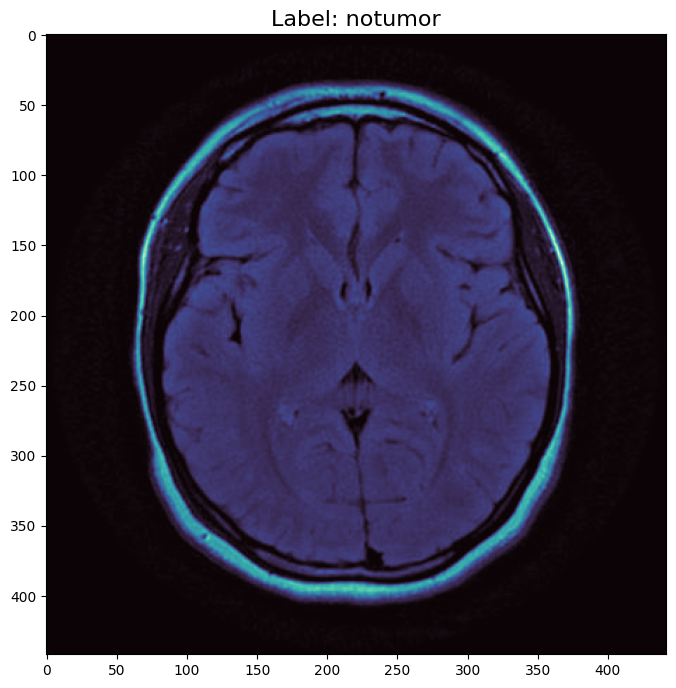

In [13]:
# Select random sample from train_df
idx = random.sample(train_df.index.to_list(), 1)[0]

# Load the random sample and label
sample_image, sample_label = _load(train_df.image_path[idx]), train_df.label[idx]

# View the random sample
view_sample(
    sample_image.permute(1, 2, 0),
    sample_label,
    color_map='mako',
)

<a id='1.4'></a>
### View Multiple Randomly Selected Samples

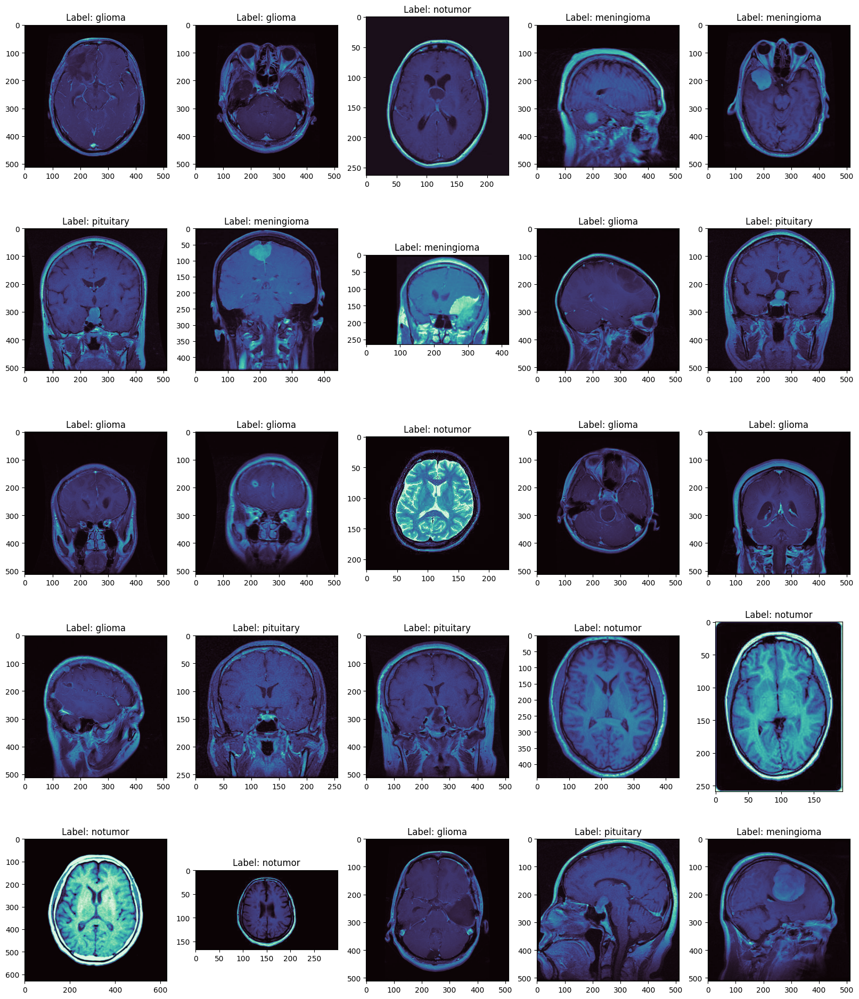

In [14]:
def view_mulitiple_samples(df, sample_loader, count=10, color_map='rgb', fig_size=(14, 10)):
    rows = count//5
    if count%5 > 0:
        rows +=1

    idx = random.sample(df.index.to_list(), count)
    fig = plt.figure(figsize=fig_size)

    for column, _ in enumerate(idx):
        plt.subplot(rows, 5, column+1)
        plt.title(f'Label: {df.label[_]}')

        if color_map=='rgb':
            plt.imshow(sample_loader(df.image_path[_]).permute(1, 2, 0))
        else:
            plt.imshow(sample_loader(df.image_path[_]).permute(1, 2, 0), cmap=color_map)

    return

# View 25 random sample images
view_mulitiple_samples(
    train_df, _load,
    count=25, color_map='mako',
    fig_size=(20, 24)
)

<a id='1.5'></a>
### Create Train and Validation sets

In [15]:
# Create Train/Val split with Training Set
train_split_idx, val_split_idx, _, _ = (
    train_test_split(
        train_df.index,
        train_df.label,
        test_size=0.20,
        stratify=train_df.label,
        random_state=CFG.SEED
    )
)

In [16]:
# Get training and remaining data
train_new_df = train_df.iloc[train_split_idx].reset_index(drop=True)
val_df = train_df.iloc[val_split_idx].reset_index(drop=True)

# View shapes
train_new_df.shape, val_df.shape

((4569, 2), (1143, 2))

In [17]:
train_size = len(train_new_df)
val_size = len(val_df)
test_size = len(test_df)
total = train_size + val_size + test_size

# View the counts
print(f'train samples count:\t\t{train_size}\t({(100 * train_size/total):.2f}%)')
print(f'validation samples count:\t{val_size}\t({(100 * val_size/total):.2f}%)')
print(f'test samples count:\t\t{test_size}\t({(100 * test_size/total):.2f}%)')
print('================================================')
print(f'TOTAL:\t\t\t\t{total}\t({(100 * total/total):.2f}%)')

train samples count:		4569	(65.06%)
validation samples count:	1143	(16.28%)
test samples count:		1311	(18.67%)
TOTAL:				7023	(100.00%)


# 2 | Build Custom Datasets & DataLoaders

In order to train the model, we need to setup an input pipeline to load, preprocess and feed the input images to the model. This pipeline is required as loading all images at once into memory may cause an out of memory error to be raised. We also batch load images for efficient memory allocation.

For this pipeline, we'll use PyTorch's data API to contruct a dataloader and custom dataset/pipeline to load our images into memory for training and inference. We'll also use the transforms API from PyTorch's torchvision library to handle image augmentations for the training set images.

> See the following for more information:
> - [PyTorch | Transforming and Augmenting Images](https://pytorch.org/vision/stable/transforms.html)
> - [PyTorch | Datasets & Dataloaders](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html)
> - [PyTorch | Data API](https://pytorch.org/docs/stable/data.html)

<br>

<a id='2.1'></a>
### Define & Inspect Image Transforms

In [18]:
# Augment train data
train_transforms = transforms.Compose([
    transforms.Resize((CFG.HEIGHT, CFG.WIDTH)),
    transforms.Grayscale(num_output_channels=3),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
#     transforms.RandomRotation(degrees=30,),
    transforms.ToTensor()
])

# Only reshape test data
test_transforms = transforms.Compose([
    transforms.Resize((CFG.HEIGHT, CFG.WIDTH)),
    transforms.Grayscale(num_output_channels=3),
    transforms.ToTensor()
])

In [19]:
# Select random sample from train_df
idx = random.sample(train_df.index.to_list(), 1)[0]

# Load the random sample and label
aug_image = _load(train_df.image_path[idx], as_tensor=False)

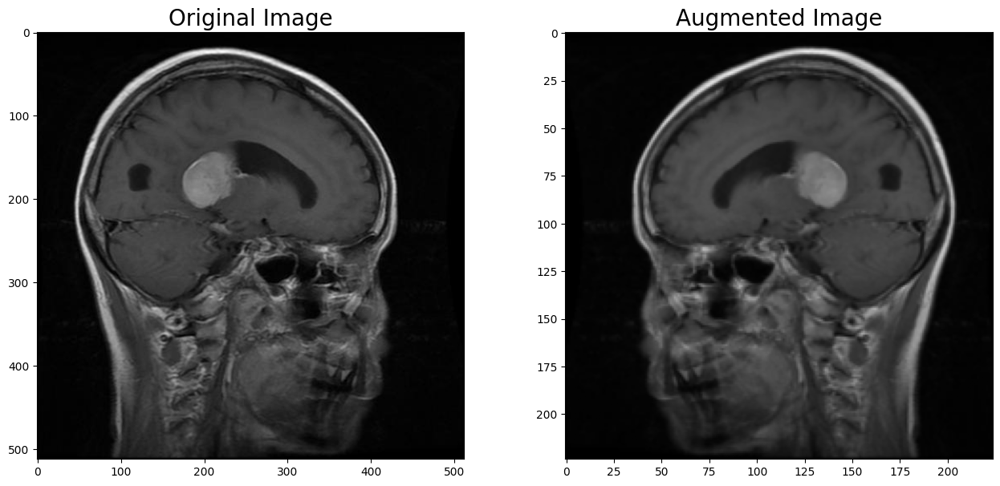

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# View Original Image
ax1.set_title('Original Image', fontsize=20)
ax1.imshow(aug_image, cmap='gray');

# View Augmented Image
ax2.set_title('Augmented Image', fontsize=20)
ax2.imshow(train_transforms(aug_image).permute(1, 2, 0), cmap='gray');

<div class="alert alert-block alert-info">
    <h3>Observe</h3>
    The train image transformer generates image augmentations that are slightly different to the original images. This is intentional as we seek augmented images that are similar to that of the original dataset images while preserving the images significant features.
</div>

In [21]:
class BrainTumorMRIDataset(Dataset):
    def __init__(self, df:pd.DataFrame, transform=None) -> None:
        super().__init__()

        self.paths = df['image_path'].to_list()
        self.labels = df['label'].to_list()
        self.transform = transform

        self.classes = sorted(list(df['label'].unique()))
        self.class_to_idx = {cls_name: _ for _, cls_name in enumerate(self.classes)}

    def load_image(self, index:int) -> Image.Image:
        image_path = self.paths[index]
        return Image.open(image_path).convert('RGB')

    def __len__(self) -> int:
        return self.paths.__len__()

    def __getitem__(self, index:int) -> Tuple[torch.Tensor, int]:
        image = self.load_image(index)
        class_name = self.labels[index]
        class_idx = self.class_to_idx[class_name]

        # Transform if necessary
        if self.transform:
            return self.transform(image), class_idx
        else:
            return image, class_idx

<a id='2.2'></a>
### Build Custom Datasets

In [22]:
# Build train dataset
train_ds = BrainTumorMRIDataset(train_new_df, transform=train_transforms)

# Build validation dataset
val_ds = BrainTumorMRIDataset(val_df, transform=test_transforms)

# Build test dataset
test_ds = BrainTumorMRIDataset(test_df, transform=test_transforms)

<a id='2.3'></a>
### Build DataLoaders from Custom Datasets

In [23]:
# Build train dataloader
train_loader = DataLoader(
    dataset=train_ds,
    batch_size=CFG.BATCH_SIZE,
    num_workers=CFG.NUM_WORKERS,
    shuffle=CFG.APPLY_SHUFFLE
)

# Build validation dataloader
val_loader = DataLoader(
    dataset=val_ds,
    batch_size=CFG.BATCH_SIZE,
    num_workers=CFG.NUM_WORKERS,
    shuffle=False
)

# Build test dataloader
test_loader = DataLoader(
    dataset=test_ds,
    batch_size=CFG.BATCH_SIZE,
    num_workers=CFG.NUM_WORKERS,
    shuffle=False
)

# 3 | Transfer Learning Model: EfficientNet V2 Large

EfficientNet V2 is a convolutional neural network that has faster training speed and better parameter efficiency than previous EfficientNet V1 models. To develop these models, the authors use a combination of training-aware neural architecture search and scaling, to jointly optimize training speed. The models were searched from the search space enriched with new ops such as Fused-MBConv.

<center>
    <figure>
        <img src="https://i.postimg.cc/vBSTR3V0/59864ee4.png" alt ="MBConv and Fused-MBConv" style='width: 400px;'>
        <figcaption>
            Image Source: <a href="https://wandb.ai/wandb_fc/pytorch-image-models/reports/EfficientNetV2--Vmlldzo2NTkwNTQ">[Source]</a></figcaption>
    </figure>
</center>

In this notebook we'll be using Efficient V2 Large to attempt the current classification task.

**For more information follow the links below:**
> - EfficientNet V2 Paper (2021): [EfficientNetV2: Smaller Models and Faster Training](https://arxiv.org/pdf/2104.00298v2.pdf)
> - [EfficientNet: Improving Accuracy and Efficiency through AutoML and Model Scaling](https://ai.googleblog.com/2019/05/efficientnet-improving-accuracy-and.html)
> - [Wandb: EfficientNetV2](https://wandb.ai/wandb_fc/pytorch-image-models/reports/EfficientNetV2--Vmlldzo2NTkwNTQ)
> - EfficientNet V1 Paper (2020): [EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks](https://arxiv.org/pdf/1905.11946.pdf)
> - [EfficientNet: Improving Accuracy and Efficiency through AutoML and Model Scaling](https://ai.googleblog.com/2019/05/efficientnet-improving-accuracy-and.html)


In [24]:
class EfficientNetV2Model(nn.Module):
    def __init__(self, backbone_model, name='efficientnet-v2-large',
                 num_classes=CFG.NUM_CLASSES, device=CFG.DEVICE):
        super(EfficientNetV2Model, self).__init__()

        self.backbone_model = backbone_model
        self.device = device
        self.num_classes = num_classes
        self.name = name

        classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(p=0.2, inplace=True),
            nn.Linear(in_features=1280, out_features=256, bias=True),
            nn.GELU(),
            nn.Dropout(p=0.2, inplace=True),
            nn.Linear(in_features=256, out_features=num_classes, bias=False)
        ).to(device)

        self._set_classifier(classifier)

    def _set_classifier(self, classifier:nn.Module) -> None:
        self.backbone_model.classifier = classifier

    def forward(self, image):
        return self.backbone_model(image)

In [25]:
def get_effiecientnetv2_model(
    device: torch.device=CFG.NUM_CLASSES) -> nn.Module:
    # Set the manual seeds
    torch.manual_seed(CFG.SEED)
    torch.cuda.manual_seed(CFG.SEED)

    # Get model weights
    model_weights = (
        torchvision
        .models
        .EfficientNet_V2_L_Weights
        .DEFAULT
    )

    # Get model and push to device
    model = (
        torchvision.models.efficientnet_v2_l(
            weights=model_weights
        )
    ).to(device)

    # Freeze Model Parameters
    for param in model.features.parameters():
        param.requires_grad = False

    return model

In [26]:
# Get EfficientNet v2 model
backbone_model = get_effiecientnetv2_model(CFG.DEVICE)

Downloading: "https://download.pytorch.org/models/efficientnet_v2_l-59c71312.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_l-59c71312.pth
100%|██████████| 455M/455M [00:07<00:00, 66.3MB/s]


In [27]:
efficientnetv2_params = {
    'backbone_model'    : backbone_model,
    'name'              : 'efficientnet-v2-large',
    'device'            : CFG.DEVICE
}

# Generate Model
efficientnet_model = EfficientNetV2Model(**efficientnetv2_params)

# If using GPU T4 x2 setup, use this:
if CFG.NUM_DEVICES > 1:
    efficientnet_model = nn.DataParallel(efficientnet_model)

In [28]:
# View model summary
summary(
    model=efficientnet_model,
    input_size=(CFG.BATCH_SIZE, CFG.CHANNELS, CFG.WIDTH, CFG.HEIGHT),
    col_names=["input_size", "output_size", "num_params", "trainable"],
    col_width=20,
    row_settings=["var_names"]
)

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
EfficientNetV2Model (EfficientNetV2Model)                         [32, 3, 224, 224]    [32, 4]              --                   Partial
├─EfficientNet (backbone_model)                                   [32, 3, 224, 224]    [32, 4]              --                   Partial
│    └─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    │    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   (928)                False
│    │    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 32, 112, 112]   (37,120)             False
│    │    └─Sequential (2)                                        [32, 32, 112, 112]   [32, 64, 56, 56]     (1,032,320)          False
│    │    └─Sequential (3)                     

# 4 | Train Model

To train this model we'll use Binary Crossentropy as the loss function since this is a classification problem for binary labels. As for the optimizer, we'll use the AdamW optimizer with 0.001 as the (default) learning rate. The only metrics we'll track during the training of the model will be the loss and accuracy metrics.

### See the following for more information:
- **Crossentropy Loss Function:**
    - [Understanding Categorical Cross-Entropy Loss, Binary Cross-Entropy Loss, Softmax Loss, Logistic Loss, Focal Loss and all those confusing names](https://gombru.github.io/2018/05/23/cross_entropy_loss/)
    - [PyTorch Crossentropy Loss Implementation](https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html)
- **AdamW Optimizer:**
    - [(Paper) AdamW: Decoupled Weight Decay Regularization](https://arxiv.org/abs/1711.05101)
    - [PyTorch AdamW Implementation](https://pytorch.org/docs/stable/generated/torch.optim.AdamW.html)
    - [(Paper) Adam: A Method for Stochastic Optimization](https://arxiv.org/abs/1412.6980)
<br>

<a id='4.1'></a>
### Define Loss & Optimizer

In [29]:
# Define Loss Function
loss_fn = nn.CrossEntropyLoss(
    label_smoothing=0.1
)

# Define Optimizer
optimizer = torch.optim.AdamW(
    efficientnet_model.parameters(),
    lr=CFG.LR
)

<a id='4.2'></a>
### Define Epoch Execution (Train Step)

In [30]:
def execute_epoch(
    model:torch.nn.Module,
    dataloader:torch.utils.data.DataLoader,
    optimizer:torch.optim.Optimizer,
    loss_fn:torch.nn.Module,
    device:torch.device) -> Tuple[float, float]:

    # Set model into training mode
    model.train()

    # Initialize train loss & accuracy
    train_loss, train_acc = 0, 0

    # Execute training loop over train dataloader
    for batch, (X, y) in enumerate(tqdm(dataloader)):
        # Load data onto target device
        X, y = X.to(device), y.to(device)

        # Feed-forward and compute metrics
        y_pred = model(X)
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()

        # Reset Gradients & Backpropagate Loss
        optimizer.zero_grad()
        loss.backward()

        # Update Model Gradients
        optimizer.step()

        # Compute Batch Metrics
        predicted_class = torch.argmax(
            torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (predicted_class == y).sum().item() / len(y_pred)

    # Compute Step Metrics
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)

    return train_loss, train_acc

<a id='4.3'></a>
### Define Evaluation Step

In [31]:
def evaluate(
    model:torch.nn.Module,
    dataloader:torch.utils.data.DataLoader,
    loss_fn:torch.nn.Module,
    device:torch.device) -> Tuple[float, float]:

    # Set model into eval mode
    model.eval()

    # Initialize eval loss & accuracy
    eval_loss, eval_acc = 0, 0

    # Active inferene context manager
    with torch.inference_mode():
        # Execute eval loop over dataloader
        for batch, (X, y) in enumerate(dataloader):
            # Load data onto target device
            X, y = X.to(device), y.to(device)

            # Feed-forward and compute metrics
            y_pred = model(X)
            loss = loss_fn(y_pred, y)
            eval_loss += loss.item()

            # Compute Batch Metrics
            predicted_class = torch.argmax(
                torch.softmax(y_pred, dim=1), dim=1)
            eval_acc += (predicted_class == y).sum().item() / len(y_pred)

    # Compute Step Metrics
    eval_loss = eval_loss / len(dataloader)
    eval_acc = eval_acc / len(dataloader)

    return eval_loss, eval_acc

<a id='4.4'></a>
### Construct Training Loop

In [32]:
def train(
    model:torch.nn.Module,
    train_dataloader:torch.utils.data.DataLoader,
    eval_dataloader:torch.utils.data.DataLoader,
    optimizer:torch.optim.Optimizer,
    loss_fn:torch.nn.Module,
    epochs:int,
    device:torch.device) -> Dict[str, List]:

    # Initialize training session
    session = {
        'loss'          : [],
        'accuracy'      : [],
        'eval_loss'     : [],
        'eval_accuaracy': []
    }

    # Training loop
    for epoch in tqdm(range(epochs)):
        # Execute Epoch
        print(f'\nEpoch {epoch + 1}/{epochs}')
        train_loss, train_acc = execute_epoch(
            model,
            train_dataloader,
            optimizer,
            loss_fn,
            device
        )

        # Evaluate Model
        eval_loss, eval_acc = evaluate(
            model,
            eval_dataloader,
            loss_fn,
            device
        )

        # Log Epoch Metrics
        print(f'loss: {train_loss:.4f} - acc: {train_acc:.4f} - eval_loss: {eval_loss:.4f} - eval_acc: {eval_acc:.4f}')

        # Record Epoch Metrics
        session['loss'].append(train_loss)
        session['accuracy'].append(train_acc)
        session['eval_loss'].append(eval_loss)
        session['eval_accuaracy'].append(eval_acc)

    # Return Session Metrics
    return session

<a id='4.5'></a>
### Train EfficientNet Model

In [33]:
# Train the model
print('Training EfficientNet Model')
print(f'Train on {len(train_new_df)} samples, validate on {len(val_df)} samples.')
print('----------------------------------')

efficientnet_session_config = {
    'model'               : efficientnet_model,
    'train_dataloader'    : train_loader,
    'eval_dataloader'     : val_loader,
    'optimizer'           : optimizer,
    'loss_fn'             : loss_fn,
    'epochs'              : CFG.EPOCHS,
    'device'              : CFG.DEVICE
}

efficientnet_session_history = train(**efficientnet_session_config)

Training EfficientNet Model
Train on 4569 samples, validate on 1143 samples.
----------------------------------


  0%|          | 0/30 [00:00<?, ?it/s]


Epoch 1/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.7744 - acc: 0.7868 - eval_loss: 0.5901 - eval_acc: 0.8802

Epoch 2/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.6509 - acc: 0.8624 - eval_loss: 0.5553 - eval_acc: 0.9030

Epoch 3/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.6194 - acc: 0.8778 - eval_loss: 0.5521 - eval_acc: 0.9026

Epoch 4/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.6088 - acc: 0.8803 - eval_loss: 0.5381 - eval_acc: 0.9090

Epoch 5/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5858 - acc: 0.8962 - eval_loss: 0.5183 - eval_acc: 0.9221

Epoch 6/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5867 - acc: 0.8903 - eval_loss: 0.5323 - eval_acc: 0.9094

Epoch 7/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5692 - acc: 0.9056 - eval_loss: 0.5047 - eval_acc: 0.9186

Epoch 8/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5637 - acc: 0.9039 - eval_loss: 0.5066 - eval_acc: 0.9267

Epoch 9/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5521 - acc: 0.9131 - eval_loss: 0.4968 - eval_acc: 0.9302

Epoch 10/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5470 - acc: 0.9165 - eval_loss: 0.5006 - eval_acc: 0.9346

Epoch 11/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5534 - acc: 0.9115 - eval_loss: 0.5017 - eval_acc: 0.9311

Epoch 12/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5538 - acc: 0.9147 - eval_loss: 0.4901 - eval_acc: 0.9372

Epoch 13/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5395 - acc: 0.9228 - eval_loss: 0.4944 - eval_acc: 0.9337

Epoch 14/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5388 - acc: 0.9198 - eval_loss: 0.5024 - eval_acc: 0.9293

Epoch 15/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5329 - acc: 0.9207 - eval_loss: 0.4816 - eval_acc: 0.9372

Epoch 16/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5391 - acc: 0.9219 - eval_loss: 0.4850 - eval_acc: 0.9368

Epoch 17/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5288 - acc: 0.9262 - eval_loss: 0.4845 - eval_acc: 0.9424

Epoch 18/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5263 - acc: 0.9261 - eval_loss: 0.4782 - eval_acc: 0.9432

Epoch 19/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5334 - acc: 0.9264 - eval_loss: 0.4975 - eval_acc: 0.9351

Epoch 20/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5246 - acc: 0.9289 - eval_loss: 0.4828 - eval_acc: 0.9484

Epoch 21/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5155 - acc: 0.9345 - eval_loss: 0.4843 - eval_acc: 0.9406

Epoch 22/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5258 - acc: 0.9291 - eval_loss: 0.4853 - eval_acc: 0.9441

Epoch 23/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5222 - acc: 0.9323 - eval_loss: 0.4915 - eval_acc: 0.9363

Epoch 24/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5102 - acc: 0.9391 - eval_loss: 0.4793 - eval_acc: 0.9380

Epoch 25/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5156 - acc: 0.9355 - eval_loss: 0.4800 - eval_acc: 0.9467

Epoch 26/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5101 - acc: 0.9373 - eval_loss: 0.4749 - eval_acc: 0.9441

Epoch 27/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5280 - acc: 0.9275 - eval_loss: 0.4780 - eval_acc: 0.9467

Epoch 28/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5120 - acc: 0.9368 - eval_loss: 0.4695 - eval_acc: 0.9528

Epoch 29/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5145 - acc: 0.9361 - eval_loss: 0.4701 - eval_acc: 0.9510

Epoch 30/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5119 - acc: 0.9383 - eval_loss: 0.4684 - eval_acc: 0.9528


In [34]:
def predict(
    model:nn.Module,
    sample_loader:torch.utils.data.DataLoader,
    device:torch.device) -> np.ndarray:

    # Set model into eval mode
    model.eval()

    predictions = []

    # Active inferene context manager
    with torch.inference_mode():
        # Execute eval loop over dataloader
        for batch, (X, y) in enumerate(tqdm(sample_loader)):
            # Load data onto target device
            X, y = X.to(device), y.to(device)

            # Feed-forward and compute metrics
            y_pred = model(X)

            # Compute Batch Metrics
            predicted_probs = torch.softmax(y_pred, dim=1).cpu().numpy()

            # Record prediction
            predictions.append(predicted_probs)

    return np.vstack(predictions)

In [35]:
# Generate test sample probabilities
efficientnet_test_probs = predict(efficientnet_model, test_loader, CFG.DEVICE)

  0%|          | 0/41 [00:00<?, ?it/s]

In [36]:
# Generate test sample preditions
efficientnet_test_preds = np.argmax(efficientnet_test_probs, axis=1)

# 5 | Transfer Learning Model: Vision Transformer     

The Vision Transformer (ViT) model was introduced in a conference research paper titled "An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale," published at The International Conference on Learning Representations (ICLR) in 2021. ViTs are used in image recognition tasks such as object detection, image segementation, action recognition and image classification.

ViTs are based off transformer architectures used in Natural Language Processing (NLP) which converts texts into sequence tokens and generates text embeddings. However, with ViTs an input image is preprocessed into patches which are reminiscent of word tokens for NPL transformers. These 'patches' are used along with the transform encoder to generate image embeddings. The transformer encoder blocks consists of three components, namely:
1. **Layer Normalization:** Applied to the patches and attention for computational speedup.
2. **Multi-head Attention:** Used to generate and concatenate attention heads for all patches to capture local and global dependencies in an image.
3. **Multi-Layer Perceptrons (MLP):** Takes the attention heads and passes them through two dense layers with the Gaussian Error Linear Unit (GELU) as the activation function.

<center>
    <figure>
        <img src="https://substackcdn.com/image/fetch/w_1456,c_limit,f_webp,q_auto:good,fl_progressive:steep/https%3A%2F%2Fbucketeer-e05bbc84-baa3-437e-9518-adb32be77984.s3.amazonaws.com%2Fpublic%2Fimages%2F9c096bed-e908-49da-a716-f8a78de952a3_1358x892.png" alt ="Vision Transformer" style='width:60%;'>
        <figcaption>
            Source: <a href="https://cameronrwolfe.substack.com/p/vision-transformers">Deep (Learning) Focus | Vision Transformers</a></figcaption>
    </figure>
</center>

<br>

In comparison to traditional Convolution Neural Network (CNN) Architechtures, Vision Transformers achive remarkable results while requiring less computational resources for pre-training. However, Vision Transformers exhibits weaker inductive bias which leads to an increased reliance on regularization techniques and data augmentation for smaller datasets. For this reason, CNNs generally perform better on smaller datasets while Vision Transformers excel on large datasets.

So for this section we will use the pre-trained ViT-L-B32 model.

**For more information see the following:**
> - Vision Transformer Paper: [An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale (2021)](https://arxiv.org/pdf/2010.11929.pdf)
> - Attention Mechanism Paper: [Attention Is All You Need (2017)](https://arxiv.org/pdf/1706.03762.pdf)
> - V7Labs Article: [Vision Transformer: What It Is & How It Works [2023 Guide]](https://www.v7labs.com/blog/vision-transformer-guide)
> - Viso.ai Article: [Vision Transformers (ViT) in Image Recognition – 2022 Guide](https://viso.ai/deep-learning/vision-transformer-vit/)

In [37]:
class VisionTransformerModel(nn.Module):
    def __init__(self, backbone_model, name='vision-transformer',
                 num_classes=CFG.NUM_CLASSES, device=CFG.DEVICE):
        super(VisionTransformerModel, self).__init__()

        self.backbone_model = backbone_model
        self.device = device
        self.num_classes = num_classes
        self.name = name

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(p=0.2, inplace=True),
            nn.Linear(in_features=1000, out_features=256, bias=True),
            nn.GELU(),
            nn.Dropout(p=0.2, inplace=True),
            nn.Linear(in_features=256, out_features=num_classes, bias=False)
        ).to(device)

    def forward(self, image):
        vit_output = self.backbone_model(image)
        return self.classifier(vit_output)

In [38]:
def get_vit_b32_model(
    device: torch.device=CFG.NUM_CLASSES) -> nn.Module:
    # Set the manual seeds
    torch.manual_seed(CFG.SEED)
    torch.cuda.manual_seed(CFG.SEED)

    # Get model weights
    model_weights = (
        torchvision
        .models
        .ViT_L_32_Weights
        .DEFAULT
    )

    # Get model and push to device
    model = (
        torchvision.models.vit_l_32(
            weights=model_weights
        )
    ).to(device)

    # Freeze Model Parameters
    for param in model.parameters():
        param.requires_grad = False

    return model

In [39]:
# Get ViT model
vit_backbone = get_vit_b32_model(CFG.DEVICE)

Downloading: "https://download.pytorch.org/models/vit_l_32-c7638314.pth" to /root/.cache/torch/hub/checkpoints/vit_l_32-c7638314.pth
100%|██████████| 1.14G/1.14G [00:15<00:00, 80.7MB/s]


In [40]:
vit_params = {
    'backbone_model'    : vit_backbone,
    'name'              : 'ViT-L-B32',
    'device'            : CFG.DEVICE
}

# Generate Model
vit_model = VisionTransformerModel(**vit_params)

# If using GPU T4 x2 setup, use this:
if CFG.NUM_DEVICES > 1:
    vit_model = nn.DataParallel(vit_model)

In [41]:
# View model summary
summary(
    model=vit_model,
    input_size=(CFG.BATCH_SIZE, CFG.CHANNELS, CFG.WIDTH, CFG.HEIGHT),
    col_names=["input_size", "output_size", "num_params", "trainable"],
    col_width=20,
    row_settings=["var_names"]
)

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
VisionTransformerModel (VisionTransformerModel)                   [32, 3, 224, 224]    [32, 4]              --                   Partial
├─VisionTransformer (backbone_model)                              [32, 3, 224, 224]    [32, 1000]           1,024                False
│    └─Conv2d (conv_proj)                                         [32, 3, 224, 224]    [32, 1024, 7, 7]     (3,146,752)          False
│    └─Encoder (encoder)                                          [32, 50, 1024]       [32, 50, 1024]       51,200               False
│    │    └─Dropout (dropout)                                     [32, 50, 1024]       [32, 50, 1024]       --                   --
│    │    └─Sequential (layers)                                   [32, 50, 1024]       [32, 50, 1024]       (302,309,376)        False
│    │    └─LayerNorm (ln)                          

In [42]:
# Define Loss Function
vit_loss_fn = nn.CrossEntropyLoss(
    label_smoothing=0.1
)

# Define Optimizer
vit_optimizer = torch.optim.AdamW(
    vit_model.parameters(),
    lr=CFG.LR
)

In [43]:
# Train the model
print('Training ViT Model')
print(f'Train on {len(train_new_df)} samples, validate on {len(val_df)} samples.')
print('----------------------------------')

vit_session_config = {
    'model'               : vit_model,
    'train_dataloader'    : train_loader,
    'eval_dataloader'     : val_loader,
    'optimizer'           : vit_optimizer,
    'loss_fn'             : vit_loss_fn,
    'epochs'              : CFG.EPOCHS,
    'device'              : CFG.DEVICE
}

vit_session_history = train(**vit_session_config)

Training ViT Model
Train on 4569 samples, validate on 1143 samples.
----------------------------------


  0%|          | 0/30 [00:00<?, ?it/s]


Epoch 1/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.7812 - acc: 0.7689 - eval_loss: 0.6582 - eval_acc: 0.8491

Epoch 2/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.6564 - acc: 0.8503 - eval_loss: 0.5836 - eval_acc: 0.8920

Epoch 3/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.6267 - acc: 0.8560 - eval_loss: 0.5601 - eval_acc: 0.8955

Epoch 4/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5930 - acc: 0.8847 - eval_loss: 0.5954 - eval_acc: 0.8741

Epoch 5/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5819 - acc: 0.8870 - eval_loss: 0.5859 - eval_acc: 0.8908

Epoch 6/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5708 - acc: 0.8981 - eval_loss: 0.5491 - eval_acc: 0.8967

Epoch 7/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5555 - acc: 0.9081 - eval_loss: 0.5390 - eval_acc: 0.9071

Epoch 8/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5511 - acc: 0.9078 - eval_loss: 0.5217 - eval_acc: 0.9103

Epoch 9/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5438 - acc: 0.9159 - eval_loss: 0.5703 - eval_acc: 0.8934

Epoch 10/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5395 - acc: 0.9147 - eval_loss: 0.5148 - eval_acc: 0.9198

Epoch 11/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5308 - acc: 0.9219 - eval_loss: 0.5324 - eval_acc: 0.9151

Epoch 12/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5353 - acc: 0.9229 - eval_loss: 0.5151 - eval_acc: 0.9253

Epoch 13/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5265 - acc: 0.9243 - eval_loss: 0.5029 - eval_acc: 0.9259

Epoch 14/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5234 - acc: 0.9280 - eval_loss: 0.5134 - eval_acc: 0.9134

Epoch 15/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5146 - acc: 0.9335 - eval_loss: 0.4983 - eval_acc: 0.9346

Epoch 16/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5143 - acc: 0.9342 - eval_loss: 0.4993 - eval_acc: 0.9290

Epoch 17/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5063 - acc: 0.9355 - eval_loss: 0.4920 - eval_acc: 0.9386

Epoch 18/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5077 - acc: 0.9350 - eval_loss: 0.4900 - eval_acc: 0.9372

Epoch 19/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5056 - acc: 0.9388 - eval_loss: 0.5011 - eval_acc: 0.9306

Epoch 20/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5027 - acc: 0.9385 - eval_loss: 0.4833 - eval_acc: 0.9392

Epoch 21/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5014 - acc: 0.9458 - eval_loss: 0.4908 - eval_acc: 0.9358

Epoch 22/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.5055 - acc: 0.9412 - eval_loss: 0.5033 - eval_acc: 0.9323

Epoch 23/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.4933 - acc: 0.9469 - eval_loss: 0.4864 - eval_acc: 0.9384

Epoch 24/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.4860 - acc: 0.9512 - eval_loss: 0.4886 - eval_acc: 0.9337

Epoch 25/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.4927 - acc: 0.9510 - eval_loss: 0.4907 - eval_acc: 0.9366

Epoch 26/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.4892 - acc: 0.9477 - eval_loss: 0.4831 - eval_acc: 0.9406

Epoch 27/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.4895 - acc: 0.9470 - eval_loss: 0.4871 - eval_acc: 0.9358

Epoch 28/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.4858 - acc: 0.9455 - eval_loss: 0.4909 - eval_acc: 0.9372

Epoch 29/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.4861 - acc: 0.9487 - eval_loss: 0.4938 - eval_acc: 0.9392

Epoch 30/30


  0%|          | 0/143 [00:00<?, ?it/s]

loss: 0.4846 - acc: 0.9509 - eval_loss: 0.4804 - eval_acc: 0.9389


In [44]:
# Generate test sample probabilities
vit_test_probs = predict(vit_model, test_loader, CFG.DEVICE)

  0%|          | 0/41 [00:00<?, ?it/s]

In [45]:
# Generate test sample preditions
vit_test_preds = np.argmax(vit_test_probs, axis=1)

# 6 | Performance Analysis

<a id='6.1'></a>
### Plot Model Performance Records

In [46]:
def plot_training_curves(history):

    loss = np.array(history['loss'])
    val_loss = np.array(history['eval_loss'])

    accuracy = np.array(history['accuracy'])
    val_accuracy = np.array(history['eval_accuaracy'])

    epochs = range(len(history['loss']))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

    # Plot loss
    ax1.plot(epochs, loss, label='training_loss', marker='o')
    ax1.plot(epochs, val_loss, label='eval_loss', marker='o')

    ax1.fill_between(epochs, loss, val_loss, where=(loss > val_loss), color='C0', alpha=0.3, interpolate=True)
    ax1.fill_between(epochs, loss, val_loss, where=(loss < val_loss), color='C1', alpha=0.3, interpolate=True)

    ax1.set_title('Loss (Lower Means Better)', fontsize=16)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.legend()

    # Plot accuracy
    ax2.plot(epochs, accuracy, label='training_accuracy', marker='o')
    ax2.plot(epochs, val_accuracy, label='eval_accuracy', marker='o')

    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy > val_accuracy), color='C0', alpha=0.3, interpolate=True)
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy < val_accuracy), color='C1', alpha=0.3, interpolate=True)

    ax2.set_title('Accuracy (Higher Means Better)', fontsize=16)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.legend();

    sns.despine();

    return

In [47]:
# Convert EfficientNet history dict to DataFrame
efficientnet_session_history_df = pd.DataFrame(efficientnet_session_history)
efficientnet_session_history_df

,loss,accuracy,eval_loss,eval_accuaracy
0,0.774371,0.786809,0.590135,0.880246
1,0.650853,0.862360,0.555303,0.902966
2,0.619425,0.877780,0.552149,0.902627
3,0.608785,0.880280,0.538102,0.909043
4,0.585763,0.896233,0.518344,0.922064
5,0.586725,0.890332,0.532341,0.909383
6,0.569169,0.905594,0.504738,0.918591
7,0.563656,0.903942,0.506634,0.926744
8,0.552135,0.913121,0.496813,0.930216
9,0.546998,0.916460,0.500629,0.934556


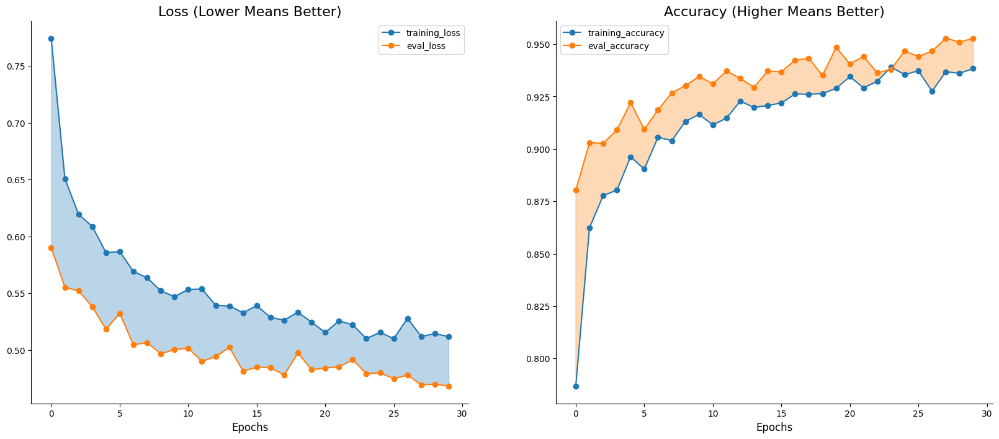

In [48]:
# Plot EfficientNet session training history
plot_training_curves(efficientnet_session_history)

In [49]:
# Convert ViT history dict to DataFrame
vit_session_history_df = pd.DataFrame(vit_session_history)
vit_session_history_df

,loss,accuracy,eval_loss,eval_accuaracy
0,0.781175,0.768864,0.658175,0.849147
1,0.656378,0.850280,0.583586,0.892021
2,0.626667,0.856023,0.560085,0.895494
3,0.593014,0.884747,0.595399,0.874132
4,0.581940,0.887019,0.585890,0.890814
5,0.570835,0.898138,0.549130,0.896701
6,0.555498,0.908129,0.539042,0.907118
7,0.551107,0.907753,0.521733,0.910251
8,0.543830,0.915900,0.570283,0.893418
9,0.539504,0.914650,0.514767,0.919799


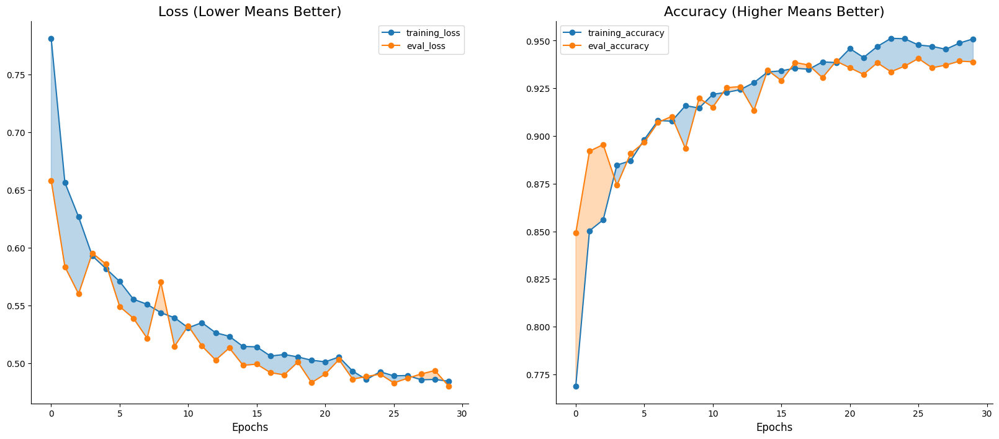

In [50]:
# Plot ViT session training history
plot_training_curves(vit_session_history)

<div class="alert alert-block alert-info">
    <h3>Observe</h3>
    We see that both models are able to converge to a lower loss. However, we see that the ViT model exhibits less stable convergence in comparison to the EfficientNet model.
</div>

<a id='6.2'></a>
### Plot Confusion Matrix

In [51]:
def plot_confusion_matrix(y_true, y_pred, classes='auto', figsize=(10, 10), text_size=12):
    # Generate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Set plot size
    plt.figure(figsize=figsize)

    # Create confusion matrix heatmap
    disp = sns.heatmap(
        cm, annot=True, cmap='Greens',
        annot_kws={"size": text_size}, fmt='g',
        linewidths=0.5, linecolor='black', clip_on=False,
        xticklabels=classes, yticklabels=classes)

    # Set title and axis labels
    disp.set_title('Confusion Matrix', fontsize=24)
    disp.set_xlabel('Predicted Label', fontsize=20)
    disp.set_ylabel('True Label', fontsize=20)
    plt.yticks(rotation=0)

    # Plot confusion matrix
    plt.show()

    return

In [52]:
test_labels = [*map(test_ds.class_to_idx.get, test_ds.labels)]

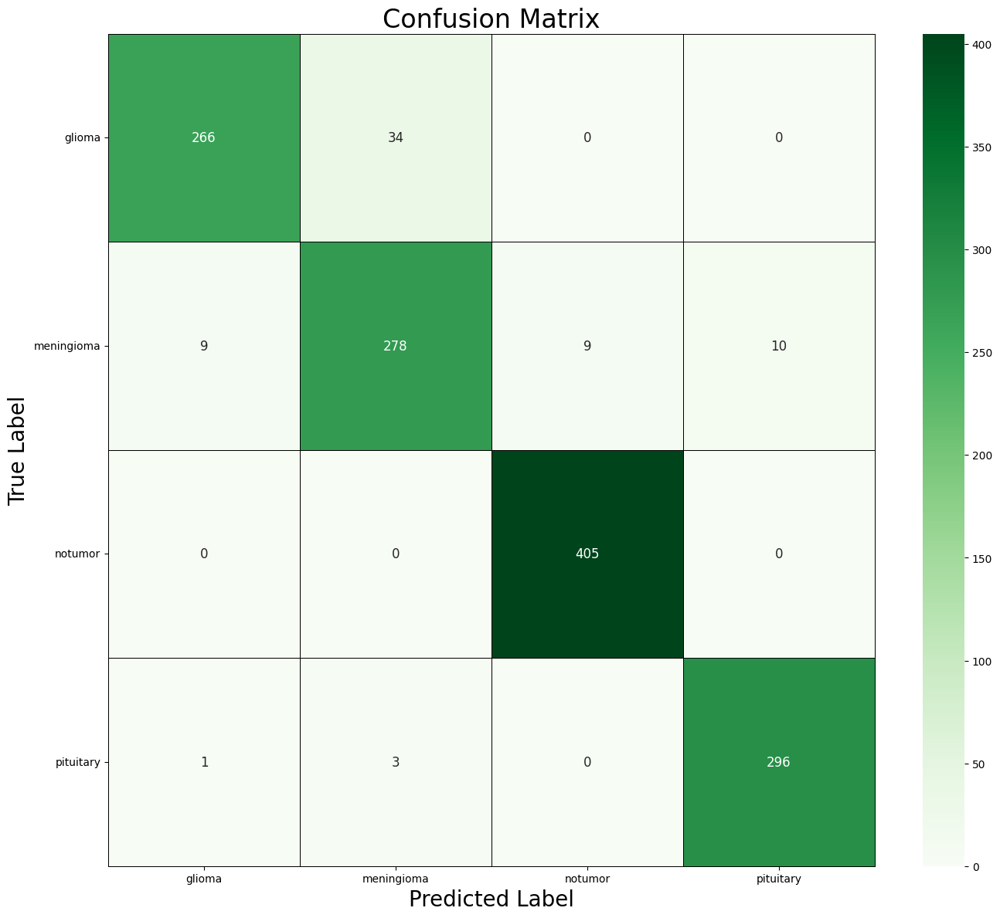

In [53]:
plot_confusion_matrix(
    test_labels,
    efficientnet_test_preds,
    figsize=(16, 14),
    classes=test_ds.classes)

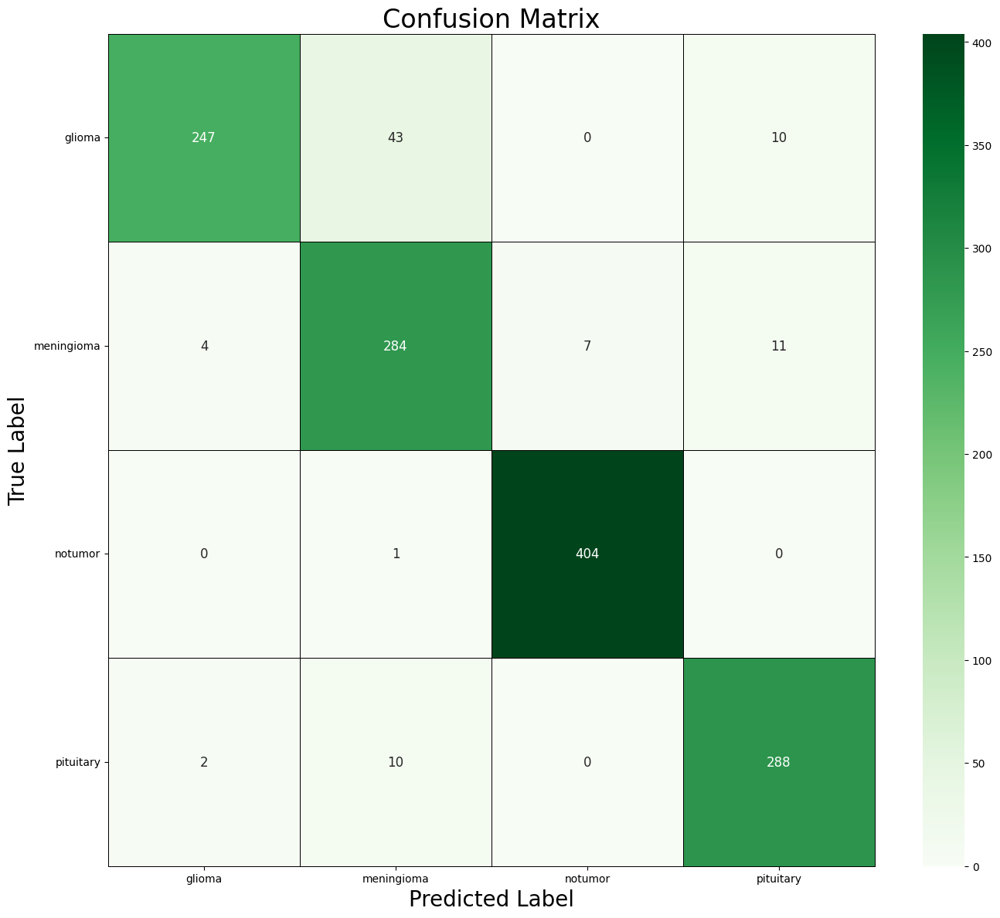

In [54]:
plot_confusion_matrix(
    test_labels,
    vit_test_preds,
    figsize=(16, 14),
    classes=test_ds.classes)

<div class="alert alert-block alert-info">
    <h3>Observe</h3>
    Both models are able to classify most of the test images correctly with some being misclassified. This may be in part due to the models not learning the required pattern(s) for the misclassified images or these images are either mislabled or noise that distort the image features.
</div>

<a id='6.3'></a>
### Plot ROC Curves

<center>
    <figure>
        <img src="https://paulvanderlaken.files.wordpress.com/2019/08/roc.gif?w=800&h=400&crop=1" alt ="AUC" style='width:75%;'>
        <figcaption>
            Source: <a href="https://paulvanderlaken.com/2019/08/16/roc-auc-precision-and-recall-visually-explained/">ROC, AUC, precision, and recall visually explained</a></figcaption>
    </figure>
</center>

An ROC (Receiver Operating Characteristic) curve is a measure that illustrates the diagnostic ability of a classifier system as its discrimination threshold is varied. The curve is created by plotting the true positive rate (TPR) on the Y-axis against the false positive rate (FPR) on the X-axis at various classification thresholds. The area under the ROC curve (AUC) is calculated and used as a metric showing how well a model can classify data points.

**For more information see the following:**
> - [What is a ROC Curve, and How Do You Use It in Performance Modeling?](https://www.simplilearn.com/what-is-a-roc-curve-and-how-to-use-it-in-performance-modeling-article)
> - [Receiver operating characteristic](https://en.wikipedia.org/wiki/Receiver_operating_characteristic)
> - [Understanding AUC-ROC: Clearly explained](https://medium.datadriveninvestor.com/understanding-auc-roc-clearly-explained-74c53d292a02)
> - [ROC, AUC, precision, and recall visually explained](https://paulvanderlaken.com/2019/08/16/roc-auc-precision-and-recall-visually-explained/)

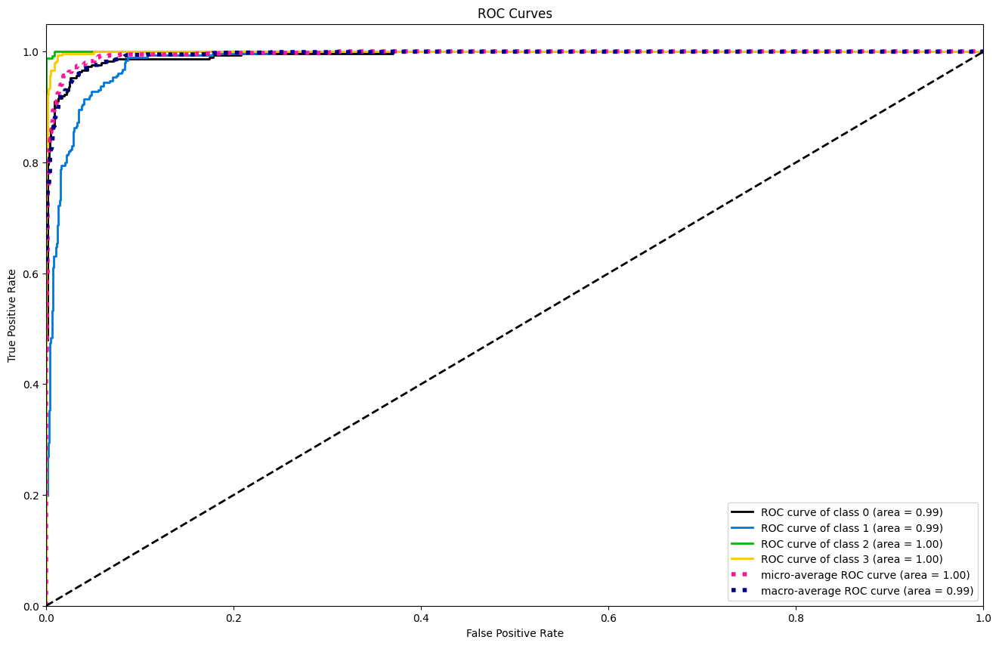

In [55]:
plot_roc(
    test_labels,
    efficientnet_test_probs,
    figsize=(16, 10), title_fontsize='large'
);

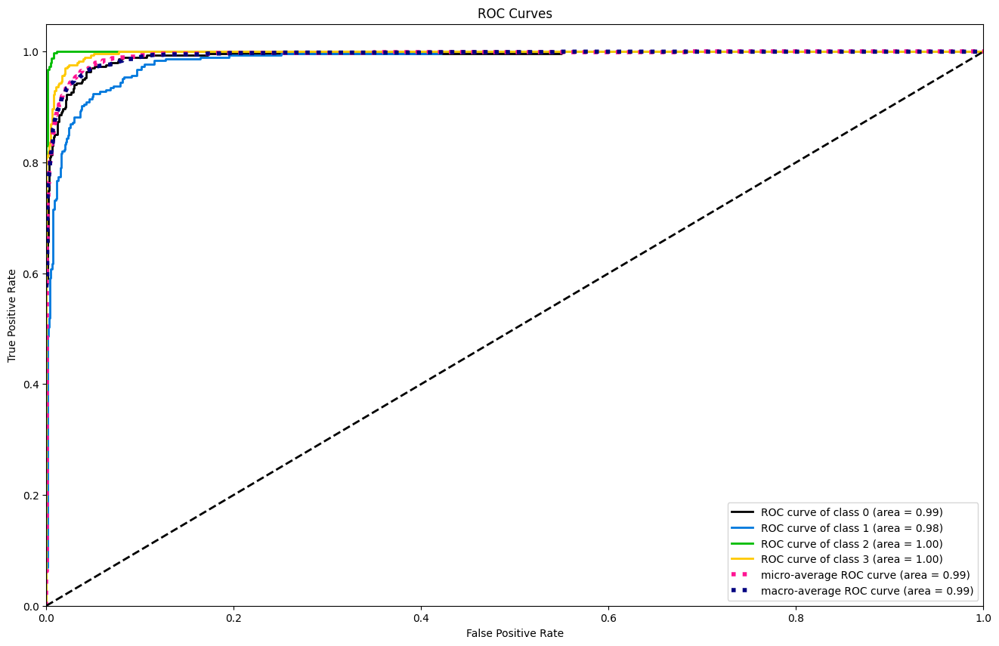

In [56]:
plot_roc(
    test_labels,
    vit_test_probs,
    figsize=(16, 10), title_fontsize='large'
);

<div class="alert alert-block alert-info">
    <h3>Observe</h3>
    Both models are able to achieve an ROC-score of close to 1.0 on average for all labels, which indicates that the models are nearly perfect classifier. However, this result should not be accepted as misclassifications are still a possibility.
</div>

<a id='6.4'></a>
### Inspect Classification Report

In [57]:
print(
    classification_report(
        test_labels,
        efficientnet_test_preds,
        target_names=test_ds.classes
))

              precision    recall  f1-score   support

      glioma       0.96      0.89      0.92       300
  meningioma       0.88      0.91      0.90       306
     notumor       0.98      1.00      0.99       405
   pituitary       0.97      0.99      0.98       300

    accuracy                           0.95      1311
   macro avg       0.95      0.95      0.95      1311
weighted avg       0.95      0.95      0.95      1311



In [58]:
print(
    classification_report(
        test_labels,
        vit_test_preds,
        target_names=test_ds.classes
))

              precision    recall  f1-score   support

      glioma       0.98      0.82      0.89       300
  meningioma       0.84      0.93      0.88       306
     notumor       0.98      1.00      0.99       405
   pituitary       0.93      0.96      0.95       300

    accuracy                           0.93      1311
   macro avg       0.93      0.93      0.93      1311
weighted avg       0.94      0.93      0.93      1311



<div class="alert alert-block alert-info">
    <h3>Observe</h3>
    Here we see that the models achieve a high f1-score for each sample class from the test set. This is an indication that the models' prediction capabilities are of high quality for each type of tumor.
</div>

<a id='6.5'></a>
### Record Classification Metrics

In [59]:
def generate_performance_scores(y_true, y_pred, y_probabilities):

    model_accuracy = accuracy_score(y_true, y_pred)
    top_2_accuracy = top_k_accuracy_score(
        y_true, y_probabilities, k=2
    )
    model_precision, model_recall, model_f1, _ = (
        precision_recall_fscore_support(
            y_true, y_pred, average="weighted"
        )
    )
    model_matthews_corrcoef = matthews_corrcoef(y_true, y_pred)

    print('=============================================')
    print(f'\nPerformance Metrics:\n')
    print('=============================================')
    print(f'accuracy_score:\t\t{model_accuracy:.4f}\n')
    print('_____________________________________________')
    print(f'top_2_accuracy_score:\t{top_2_accuracy:.4f}\n')
    print('_____________________________________________')
    print(f'precision_score:\t{model_precision:.4f}\n')
    print('_____________________________________________')
    print(f'recall_score:\t\t{model_recall:.4f}\n')
    print('_____________________________________________')
    print(f'f1_score:\t\t{model_f1:.4f}\n')
    print('_____________________________________________')
    print(f'matthews_corrcoef:\t{model_matthews_corrcoef:.4f}\n')
    print('=============================================')

    preformance_scores = {
        'accuracy_score'       : model_accuracy,
        'top_2_accuracy'       : top_2_accuracy,
        'precision_score'      : model_precision,
        'recall_score'         : model_recall,
        'f1_score'             : model_f1,
        'matthews_corrcoef'    : model_matthews_corrcoef
    }
    return preformance_scores

In [60]:
# Generate EfficieNet model performance scores
efficientnet_model_performance = generate_performance_scores(
    test_labels,
    efficientnet_test_preds,
    efficientnet_test_probs
)


Performance Metrics:

accuracy_score:		0.9497

_____________________________________________
top_2_accuracy_score:	0.9977

_____________________________________________
precision_score:	0.9501

_____________________________________________
recall_score:		0.9497

_____________________________________________
f1_score:		0.9494

_____________________________________________
matthews_corrcoef:	0.9327



In [61]:
# Generate EfficieNet model performance scores
vit_model_performance = generate_performance_scores(
    test_labels,
    vit_test_preds,
    vit_test_probs
)


Performance Metrics:

accuracy_score:		0.9329

_____________________________________________
top_2_accuracy_score:	0.9947

_____________________________________________
precision_score:	0.9365

_____________________________________________
recall_score:		0.9329

_____________________________________________
f1_score:		0.9326

_____________________________________________
matthews_corrcoef:	0.9111



In [62]:
# Record metrics with DataFrame
performance_df = pd.DataFrame({
    'efficientnet_v2_large': efficientnet_model_performance,
    'vit_l_b32': vit_model_performance,
}).T

# View Performance DataFrame
performance_df

,accuracy_score,top_2_accuracy,precision_score,recall_score,f1_score,matthews_corrcoef
efficientnet_v2_large,0.949657,0.997712,0.950099,0.949657,0.949407,0.932687
vit_l_b32,0.932876,0.994661,0.936470,0.932876,0.932612,0.911079


<div class="alert alert-block alert-info">
    <h3>Observe</h3>
    We observe that the EfficientNet model achieve a Matthews Correlation Coefficient (MCC) of above ~0.90 on the test set, which is higher than what the ViT model achieved. A high MCC implies that both models' predictions are statistically of high quality and that the models do indeed generalise to unseen samples.
</div>

<a id='6.6'></a>
### View Test Predictions

In [63]:
efficientnet_results = pd.DataFrame({
    'image_path'       : test_ds.paths,
    'label'            : test_ds.labels,
    'label_encoded'    : test_labels,
    'model_prediction' : efficientnet_test_preds,
    'model_probability': [
        efficientnet_test_probs[_][pred] for _, pred in zip(
            range(len(efficientnet_test_probs)),
            efficientnet_test_preds
        )]
})

efficientnet_results

,image_path,label,label_encoded,model_prediction,model_probability
0,Testing/glioma/Te-gl_0298.jpg,glioma,0,0,0.983182
1,Testing/glioma/Te-gl_0246.jpg,glioma,0,1,0.660390
2,Testing/glioma/Te-gl_0243.jpg,glioma,0,0,0.761846
3,Testing/glioma/Te-gl_0016.jpg,glioma,0,0,0.971761
4,Testing/glioma/Te-gl_0116.jpg,glioma,0,0,0.874421
...,...,...,...,...,...
1306,Testing/pituitary/Te-pi_0039.jpg,pituitary,3,3,0.895731
1307,Testing/pituitary/Te-pi_0095.jpg,pituitary,3,3,0.912012
1308,Testing/pituitary/Te-pi_0073.jpg,pituitary,3,3,0.996171
1309,Testing/pituitary/Te-pi_0278.jpg,pituitary,3,3,0.983206


In [64]:
def view_multiple_predictions(df, classes, sample_loader, count=10, color_map='rgb', title=None, fig_size=(14, 10)):
    rows = count//5
    if count%5 > 0:
        rows +=1

    idx = random.sample(df.index.to_list(), count)

    fig = plt.figure(figsize=fig_size)
    if title != None:
        fig.suptitle(title, fontsize=30)

    fig.tight_layout()
    fig.subplots_adjust(top=0.95)

    # Setup useful dictionaries
    label_set = {k: v for k, v in enumerate(classes)}
    color_set = {False: 'red', True: 'darkgreen'}

    for column, _ in enumerate(idx):
        # Predict label
        img = sample_loader(df.image_path[_]).permute(1, 2, 0)

        # Validate prediction correctness
        correct_prediction = (df.model_prediction[_] == df.label_encoded[_])

        # Create subplot and assign title
        ax = plt.subplot(rows, 5, column+1)
        ax.set_title(
            f'Actual Label: {df.label[_]}',
            pad=20,
            fontsize=14,
            color=color_set[correct_prediction]
        )

        # Plot image
        if color_map=='rgb':
            ax.imshow(img)
        else:
            ax.imshow(img, cmap=color_map)

        # Plot prediction  & probability
        txt = f'Prediction: {label_set[df.model_prediction[_]]}\nProbability: {(100 * df.model_probability[_]):.2f}%'
        plt.xlabel(txt, fontsize=14, color=color_set[correct_prediction])

    return

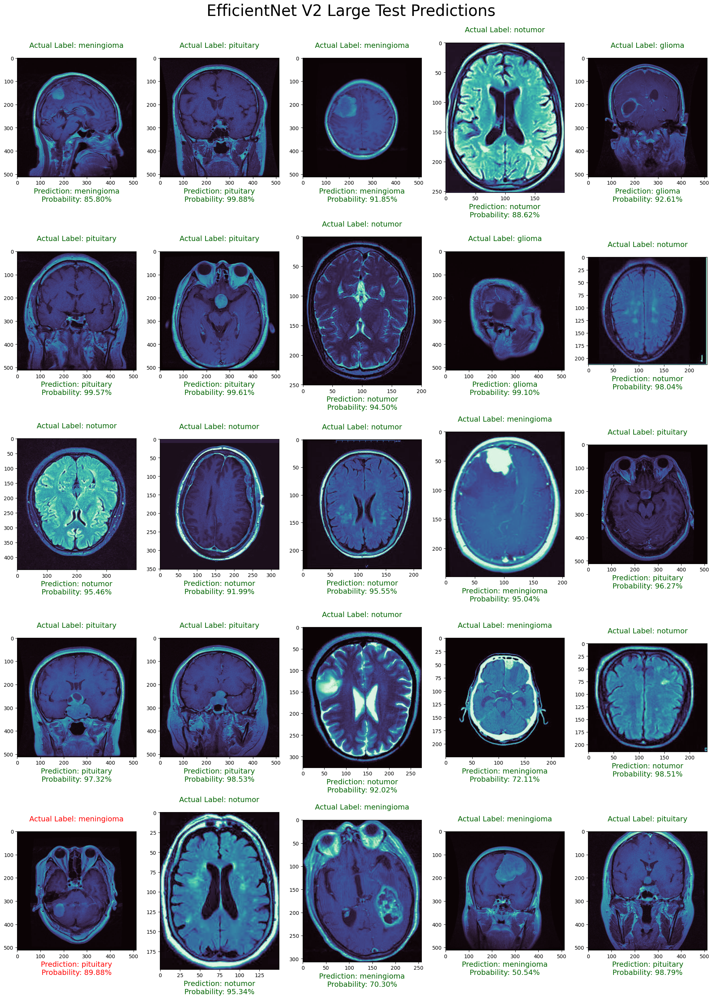

In [65]:
# View EfficientNet predictions
view_multiple_predictions(
    efficientnet_results,
    test_ds.classes,
    _load,
    count=25,
    color_map='mako',
    title='EfficientNet V2 Large Test Predictions',
    fig_size=(24, 30)
)

<a id='6.7'></a>
### Inspect Incorrect Predictions

In [66]:
# Query incorrect predictions
query_df = efficientnet_results[
    efficientnet_results['label_encoded'] != efficientnet_results['model_prediction']
].reset_index(drop=True)

# View incorrect predictions
query_df

,image_path,label,label_encoded,model_prediction,model_probability
0,Testing/glioma/Te-gl_0246.jpg,glioma,0,1,0.660390
1,Testing/glioma/Te-gl_0259.jpg,glioma,0,1,0.850789
2,Testing/glioma/Te-gl_0244.jpg,glioma,0,1,0.642496
3,Testing/glioma/Te-gl_0265.jpg,glioma,0,1,0.941495
4,Testing/glioma/Te-gl_0277.jpg,glioma,0,1,0.784460
...,...,...,...,...,...
61,Testing/meningioma/Te-me_0143.jpg,meningioma,1,2,0.751084
62,Testing/pituitary/Te-pi_0078.jpg,pituitary,3,1,0.367819
63,Testing/pituitary/Te-piTr_0002.jpg,pituitary,3,1,0.618605
64,Testing/pituitary/Te-pi_0029.jpg,pituitary,3,1,0.805317


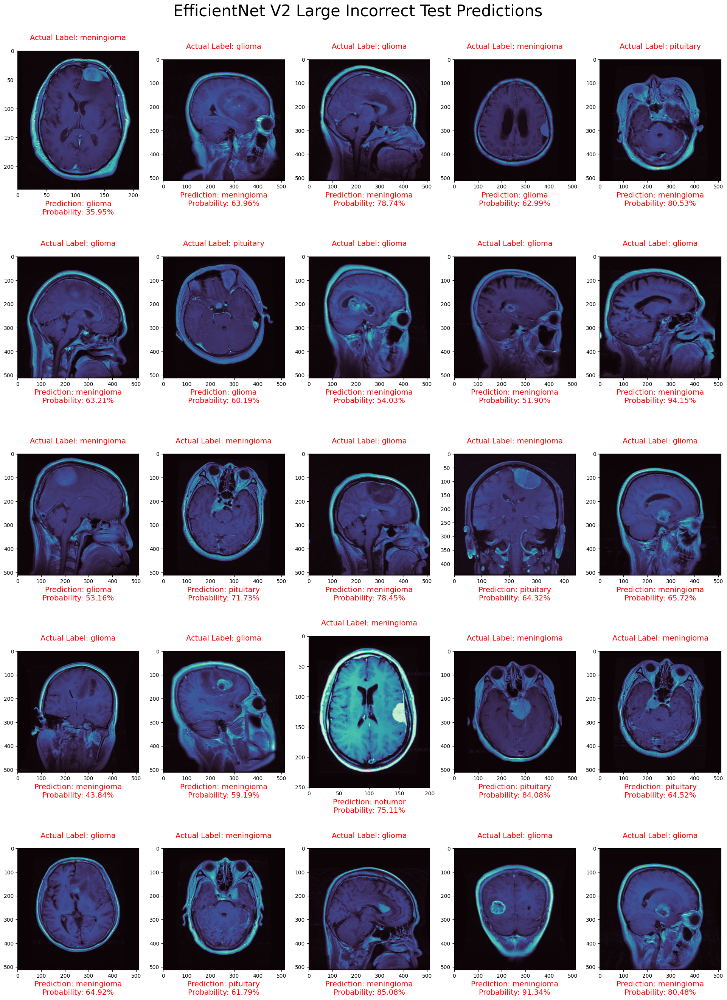

In [67]:
# View EfficientNet predictions
view_multiple_predictions(
    query_df,
    test_ds.classes,
    _load,
    count=25,
    color_map='mako',
    title='EfficientNet V2 Large Incorrect Test Predictions',
    fig_size=(24, 30)
)

In [72]:
torch.save(efficientnet_model.state_dict(), "efficientnetV2.pth")

In [73]:
torch.save(vit_model.state_dict(), "vit_model.pth")

In [75]:
# Save the model to the Colab runtime
# model.save('my_model.h5')

# Move the saved model to Google Drive
!mv vit_model.pth '/content/drive/My Drive/Project/vit_model.pth'

!mv efficientnetV2.pth '/content/drive/My Drive/Project/efficientnetV2.pth'